**Data mining Project - University of Pisa, acedemic year 2023/24**

**Authors**: Giacomo Aru, Giulia Ghisolfi, Luca Marini, Irene Testa

# Random Forest Classifier

We import the libraries and define constants and settings of the notebook:

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json
import pickle
import pydotplus
from IPython.display import Image
from sklearn.tree import export_graphviz
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, f1_score
from time import time
from classification_utils import *

pd.set_option('display.max_columns', None)
pd.set_option('max_colwidth', None)
RANDOM_STATE = 42
RESULTS_DIR = '../data/classification_results'
clf_name = 'RandomForestClassifier'

We load the data:

In [2]:
# load the data
incidents_train_df = pd.read_csv('../data/clf_indicators_train.csv', index_col=0)
incidents_test_df = pd.read_csv('../data/clf_indicators_test.csv', index_col=0)
true_labels_train_df = pd.read_csv('../data/clf_y_train.csv', index_col=0)
true_labels_train = true_labels_train_df.values.ravel()
true_labels_test_df = pd.read_csv('../data/clf_y_test.csv', index_col=0)
true_labels_test = true_labels_test_df.values.ravel()

# load the names of the features to use for the classification task
features_for_clf = json.loads(open('../data/clf_indicators_names_rule_based.json').read())

# project on the features to use
indicators_train_df = incidents_train_df[features_for_clf]
indicators_test_df = incidents_test_df[features_for_clf]

We display the features names we will use:

In [3]:
print(features_for_clf)
print(f'Number of features: {len(features_for_clf)}')

['location_imp', 'x', 'y', 'age_range', 'avg_age', 'n_child_prop', 'n_teen_prop', 'n_males_prop', 'n_participants', 'day', 'day_of_week', 'month', 'year', 'days_from_first_incident', 'poverty_perc', 'democrat', 'gun_law_rank', 'aggression', 'accidental', 'defensive', 'suicide', 'road', 'house', 'school', 'business', 'illegal_holding', 'drug_alcohol', 'officers', 'organized', 'social_reasons', 'abduction']
Number of features: 31


We define a list of the categorical features:

In [4]:
categorical_features = [
    'day', 'day_of_week', 'month', 'year',
    'democrat', 'gun_law_rank',
    'aggression', 'accidental', 'defensive', 'suicide',
    'road', 'house', 'school', 'business',
    'illegal_holding', 'drug_alcohol', 'officers', 'organized', 'social_reasons', 'abduction'
]

Parameters explored:
- n_estimators: The number of trees in the forest.
- max_features: The number of features to consider when looking for the best split. We will try both the square root of the number of features and all the features.
- max_samples: The number of samples to draw from the trainin set to train each base estimator. We will try both using all the samples and using half of the samples.
- min_samples_split: The minimum number of samples required to split an internal node. We will try 2 (the minimum possible) and different fractions of the training set.
- min_samples_leaf: The minimum number of samples required to be at a leaf node. We will try 1 (the minimum possible) and different fractions of the training set.

Fixed parameters:
- bootstrap: We will bootstrap samples when building trees.
- class_weight: Weights associated with classes. We will use 'balanced' as it performed better in the previous experiments with the Decision Tree Classifier.
- criterion: The function to measure the quality of a split. We will use 'entropy' as it slightly performed better in the previous experiments with the Decision Tree Classifier.
- max_depth: The maximum depth of the tree. We won't limit the depth of the tree through this parameter. We will control the depth of the tree using the 'min_samples_split' and 'min_samples_leaf', parameter.
- min_weight_fraction_leaf: The minimum weighted fraction of the sum total of weights (of all the input samples) required to be at a leaf node. We won't weight samples. To address class imbalance we will use the 'class_weight' parameter.
- max_leaft_nodes: The maximum number of leaf nodes. We won't limit the number of leaf nodes through this parameter. We will control the number of leaf nodes using the 'min_samples_leaf', parameter.
- min_impurity_decreas: The minimum impurity decrease to split a node. We won't use this parameter, we will use instead the 'min_samples_split' and 'min_samples_leaf' parameters to control the growth of the tree.
- ccp_alpha: Complexity parameter used for Minimal Cost-Complexity Pruning. We will later prune the best tree using this algorithm.
- oob_score: Whether to use out-of-bag samples to estimate the generalization score. This parameter is used to estimate the generalization error without using a test set. We won't use it.

In [5]:
param_grid = {
    # values to try
    'n_estimators': [100, 200],
    'max_features': ['sqrt', None],
    'max_samples': [0.5, None],
    'min_samples_split': [2, 0.01, 0.025, 0.05, 0.1],
    'min_samples_leaf': [1, 0.01, 0.025, 0.05, 0.1],
    'bootstrap': [True],
    'class_weight': ['balanced'],
    'criterion': ['entropy'],
    'n_jobs': [-1],
    'random_state': [RANDOM_STATE],
    # default values
    #'max_depth': [None],
    #'min_weight_fraction_leaf': [0],
    #'max_leaf_nodes': [None],
    #'min_impurity_decrease': [0],
    #'ccp_alpha': [0],
    #'oob_score': [False],
}
gs = GridSearchCV(
    RandomForestClassifier(),
    param_grid=param_grid,
    n_jobs=-1,
    scoring=make_scorer(f1_score),
    verbose=10,
    cv=5, # uses a stratified 5-fold cv to validate the models
    refit=False
)
gs.fit(indicators_train_df, true_labels_train)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits
[CV 2/5; 1/200] START bootstrap=True, class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100, n_jobs=-1, random_state=42
[CV 1/5; 1/200] START bootstrap=True, class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100, n_jobs=-1, random_state=42
[CV 3/5; 1/200] START bootstrap=True, class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=100, n_jobs=-1, random_state=42
[CV 1/5; 2/200] START bootstrap=True, class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.5, min_samples_leaf=1, min_samples_split=2, n_estimators=200, n_jobs=-1, random_state=42
[CV 4/5; 1/200] START bootstrap=True, class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=0.5, min_samples_

/Users/irenetesta/anaconda3/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:700: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV 3/5; 53/200] END bootstrap=True, class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=None, min_samples_leaf=1, min_samples_split=0.01, n_estimators=100, n_jobs=-1, random_state=42;, score=0.608 total time=   7.5s
[CV 5/5; 54/200] START bootstrap=True, class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=None, min_samples_leaf=1, min_samples_split=0.01, n_estimators=200, n_jobs=-1, random_state=42
[CV 4/5; 53/200] END bootstrap=True, class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=None, min_samples_leaf=1, min_samples_split=0.01, n_estimators=100, n_jobs=-1, random_state=42;, score=0.610 total time=   7.5s
[CV 2/5; 55/200] START bootstrap=True, class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples=None, min_samples_leaf=1, min_samples_split=0.025, n_estimators=100, n_jobs=-1, random_state=42
[CV 5/5; 53/200] END bootstrap=True, class_weight=balanced, criterion=entropy, max_features=sqrt, max_samples

GridSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'bootstrap': [True], 'class_weight': ['balanced'],
                         'criterion': ['entropy'],
                         'max_features': ['sqrt', None],
                         'max_samples': [0.5, None],
                         'min_samples_leaf': [1, 0.01, 0.025, 0.05, 0.1],
                         'min_samples_split': [2, 0.01, 0.025, 0.05, 0.1],
                         'n_estimators': [100, 200], 'n_jobs': [-1],
                         'random_state': [42]},
             refit=False, scoring=make_scorer(f1_score), verbose=10)

We display the grid search results:

In [6]:
cv_results_df = pd.DataFrame(gs.cv_results_)
cv_results_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_bootstrap,param_class_weight,param_criterion,param_max_features,param_max_samples,param_min_samples_leaf,param_min_samples_split,param_n_estimators,param_n_jobs,param_random_state,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,7.300382,1.238951,0.318074,0.055195,True,balanced,entropy,sqrt,0.5,1,2,100,-1,42,"{'bootstrap': True, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_features': 'sqrt', 'max_samples': 0.5, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100, 'n_jobs': -1, 'random_state': 42}",0.534914,0.546102,0.546455,0.546022,0.533786,0.541456,0.005815,128
1,13.830906,1.816936,0.661052,0.046958,True,balanced,entropy,sqrt,0.5,1,2,200,-1,42,"{'bootstrap': True, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_features': 'sqrt', 'max_samples': 0.5, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200, 'n_jobs': -1, 'random_state': 42}",0.536818,0.546142,0.546242,0.550656,0.538731,0.543718,0.005155,127
2,4.625259,0.551646,0.097802,0.059126,True,balanced,entropy,sqrt,0.5,1,0.01,100,-1,42,"{'bootstrap': True, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_features': 'sqrt', 'max_samples': 0.5, 'min_samples_leaf': 1, 'min_samples_split': 0.01, 'n_estimators': 100, 'n_jobs': -1, 'random_state': 42}",0.609738,0.614461,0.602382,0.605390,0.611103,0.608615,0.004263,5
3,7.989152,0.251577,0.204495,0.051180,True,balanced,entropy,sqrt,0.5,1,0.01,200,-1,42,"{'bootstrap': True, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_features': 'sqrt', 'max_samples': 0.5, 'min_samples_leaf': 1, 'min_samples_split': 0.01, 'n_estimators': 200, 'n_jobs': -1, 'random_state': 42}",0.608407,0.614103,0.602190,0.605787,0.611840,0.608465,0.004236,6
4,3.247191,0.240270,0.068624,0.010496,True,balanced,entropy,sqrt,0.5,1,0.025,100,-1,42,"{'bootstrap': True, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_features': 'sqrt', 'max_samples': 0.5, 'min_samples_leaf': 1, 'min_samples_split': 0.025, 'n_estimators': 100, 'n_jobs': -1, 'random_state': 42}",0.604182,0.606097,0.595340,0.600372,0.600990,0.601396,0.003681,14


We visualize the interaction of hyperparameters through a heatmap:

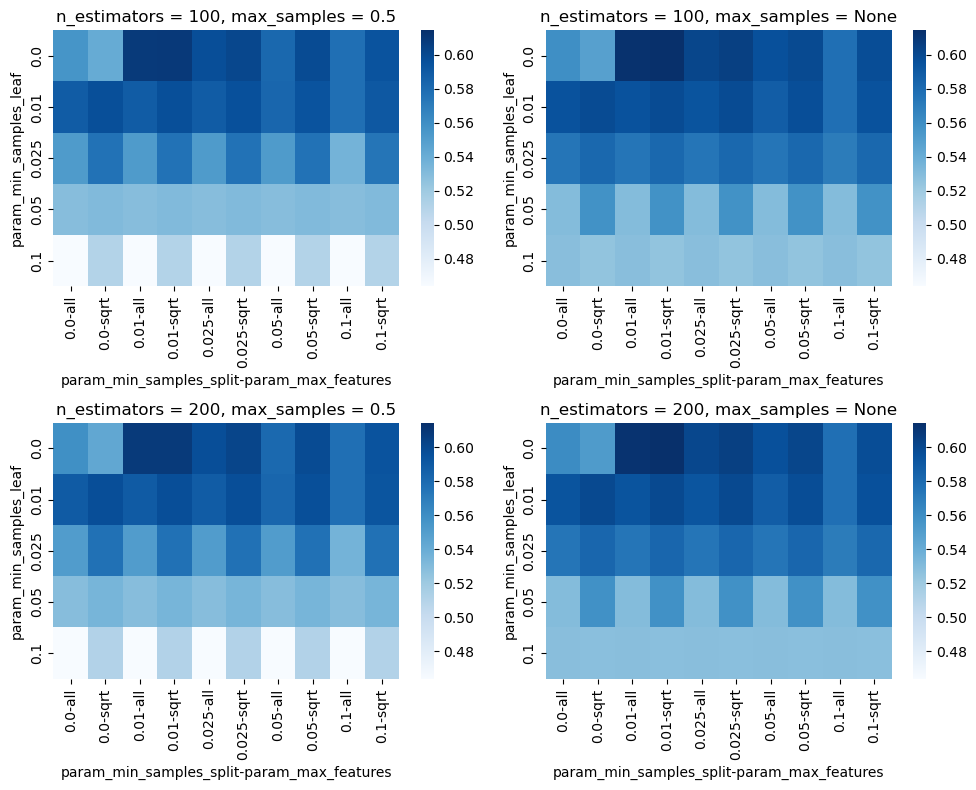

In [7]:
fig, axs = plt.subplots(2, 2, figsize=(10, 8))
# replace the minimum values for param_min_samples_split and param_min_samples_leaf with 0 to compare it with the other percentages
cv_results_df['param_min_samples_split'] = cv_results_df['param_min_samples_split'].replace(2, 0)
cv_results_df['param_min_samples_leaf'] = cv_results_df['param_min_samples_leaf'].replace(1, 0)
cv_results_df['param_max_features'] = cv_results_df['param_max_features'].fillna('all')
pvt_100_half = pd.pivot_table(
    cv_results_df[(cv_results_df['param_n_estimators'] == 100) & (cv_results_df['param_max_samples'] == 0.5)],
    values='mean_test_score',
    index=['param_min_samples_leaf'],
    columns=['param_min_samples_split', 'param_max_features']
)
pvt_100_all = pd.pivot_table(
    cv_results_df[(cv_results_df['param_n_estimators'] == 100) & (cv_results_df['param_max_samples'].isna())],
    values='mean_test_score',
    index=['param_min_samples_leaf'],
    columns=['param_min_samples_split', 'param_max_features']
)
pvt_200_half = pd.pivot_table(
    cv_results_df[(cv_results_df['param_n_estimators'] == 200) & (cv_results_df['param_max_samples'] == 0.5)],
    values='mean_test_score',
    index=['param_min_samples_leaf'],
    columns=['param_min_samples_split', 'param_max_features']
)
pvt_200_all = pd.pivot_table(
    cv_results_df[(cv_results_df['param_n_estimators'] == 200) & (cv_results_df['param_max_samples'].isna())],
    values='mean_test_score',
    index=['param_min_samples_leaf'],
    columns=['param_min_samples_split', 'param_max_features']
)
min_score = cv_results_df['mean_test_score'].min()
max_score = cv_results_df['mean_test_score'].max()
sns.heatmap(pvt_100_half, cmap='Blues', ax=axs[0][0], vmin=min_score, vmax=max_score)
axs[0][0].set_title('n_estimators = 100, max_samples = 0.5');
sns.heatmap(pvt_100_all, cmap='Blues', ax=axs[0][1], vmin=min_score, vmax=max_score)
axs[0][1].set_title('n_estimators = 100, max_samples = None');
sns.heatmap(pvt_200_half, cmap='Blues', ax=axs[1][0], vmin=min_score, vmax=max_score)
axs[1][0].set_title('n_estimators = 200, max_samples = 0.5');
sns.heatmap(pvt_200_all, cmap='Blues', ax=axs[1][1], vmin=min_score, vmax=max_score)
axs[1][1].set_title('n_estimators = 200, max_samples = None');
fig.tight_layout()

We disaply the performance of the top 10 models:

In [8]:
params = ['param_n_estimators', 'param_max_features', 'param_max_samples', 'param_min_samples_split', 'param_min_samples_leaf']
cv_results_df.sort_values(
    by='mean_test_score',
    ascending=False)[params+['mean_test_score']].head(20).style.background_gradient(subset='mean_test_score', cmap='Blues')

,param_n_estimators,param_max_features,param_max_samples,param_min_samples_split,param_min_samples_leaf,mean_test_score
53,200,sqrt,None,0.010000,0.000000,0.614493
52,100,sqrt,None,0.010000,0.000000,0.614188
152,100,all,None,0.010000,0.000000,0.612903
153,200,all,None,0.010000,0.000000,0.612356
2,100,sqrt,0.500000,0.010000,0.000000,0.608615
3,200,sqrt,0.500000,0.010000,0.000000,0.608465
103,200,all,0.500000,0.010000,0.000000,0.608423
102,100,all,0.500000,0.010000,0.000000,0.608390
55,200,sqrt,None,0.025000,0.000000,0.605633
54,100,sqrt,None,0.025000,0.000000,0.605349


We refit the best model on the whole training set:

In [9]:
best_index = gs.best_index_
best_model_params = cv_results_df.loc[best_index]['params']
best_model = RandomForestClassifier(**best_model_params)

# fit the model on all the training data
fit_start = time()
best_model.fit(indicators_train_df, true_labels_train)
fit_time = time()-fit_start

# get the predictions on the training data
train_score_start = time()
pred_labels_train = best_model.predict(indicators_train_df)
train_score_time = time()-train_score_start
pred_probas_train = best_model.predict_proba(indicators_train_df)

# get the predictions on the test data
test_score_start = time()
pred_labels_test = best_model.predict(indicators_test_df)
test_score_time = time()-test_score_start
pred_probas_test = best_model.predict_proba(indicators_test_df)

# save the predictions
pd.DataFrame(
    {'labels': pred_labels_test, 'probs': pred_probas_test[:,1]}
).to_csv(f'{RESULTS_DIR}/{clf_name}_preds.csv')

# save the model
file = open(f'{RESULTS_DIR}/{clf_name}.pkl', 'wb')
pickle.dump(obj=best_model, file=file)
file.close()

# save the cv results
best_model_cv_results = pd.DataFrame(cv_results_df.iloc[best_index]).T
best_model_cv_results.index = [clf_name]
best_model_cv_results.to_csv(f'{RESULTS_DIR}/{clf_name}_train_cv_scores.csv')

We display traning and test scores:

In [10]:
compute_clf_scores(
    y_true=true_labels_train,
    y_pred=pred_labels_train,
    train_time=fit_time,
    score_time=train_score_time,
    params=best_model_params,
    prob_pred=pred_probas_train,
    clf_name=clf_name,
    path=f'{RESULTS_DIR}/{clf_name}_train_scores.csv'
)

,precision-Non-Fatal,recall-Non-Fatal,f1-score-Non-Fatal,precision-Fatal,recall-Fatal,f1-score-Fatal,precision-macro avg,recall-macro avg,f1-score-macro avg,precision-weighted avg,recall-weighted avg,f1-score-weighted avg,accuracy,auroc,train_time,score_time,params
RandomForestClassifier,0.84759,0.70925,0.772274,0.541472,0.729157,0.621453,0.694531,0.719204,0.696864,0.749592,0.715623,0.723991,0.715623,0.803245,1.374432,0.176023,"{'bootstrap': True, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_features': 'sqrt', 'max_samples': None, 'min_samples_leaf': 1, 'min_samples_split': 0.01, 'n_estimators': 200, 'n_jobs': -1, 'random_state': 42}"


In [11]:
test_scores = compute_clf_scores(
    y_true=true_labels_test,
    y_pred=pred_labels_test,
    train_time=fit_time,
    score_time=test_score_time,
    params=best_model_params,
    prob_pred=pred_probas_test,
    clf_name=clf_name,
    path=f'{RESULTS_DIR}/{clf_name}_test_scores.csv'
)
test_scores

,precision-Non-Fatal,recall-Non-Fatal,f1-score-Non-Fatal,precision-Fatal,recall-Fatal,f1-score-Fatal,precision-macro avg,recall-macro avg,f1-score-macro avg,precision-weighted avg,recall-weighted avg,f1-score-weighted avg,accuracy,auroc,train_time,score_time,params
RandomForestClassifier,0.841808,0.706665,0.768339,0.535416,0.717967,0.613397,0.688612,0.712316,0.690868,0.743725,0.710283,0.718739,0.710283,0.794481,1.374432,0.076881,"{'bootstrap': True, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_features': 'sqrt', 'max_samples': None, 'min_samples_leaf': 1, 'min_samples_split': 0.01, 'n_estimators': 200, 'n_jobs': -1, 'random_state': 42}"


We load the dataset randomly oversampled:

In [12]:
indicators_over_train_df = pd.read_csv('../data/clf_indicators_train_over.csv', index_col=0)
indicators_over_train_df = indicators_over_train_df[features_for_clf]
true_labels_over_train = pd.read_csv('../data/clf_y_train_over.csv', index_col=0).values.ravel()

/var/folders/8n/f3j9y6bd3zd_kp83y0vvn_b80000gn/T/ipykernel_3664/2206401294.py:1: DtypeWarning: Columns (11,12,13,14,15) have mixed types. Specify dtype option on import or set low_memory=False.
  indicators_over_train_df = pd.read_csv('../data/clf_indicators_train_over.csv', index_col=0)


We fit and test the best model on the oversampled dataset:

In [13]:
# fit the model on all the training data
best_model_over = RandomForestClassifier(**best_model_params)
fit_start = time()
best_model_over.fit(indicators_over_train_df, true_labels_over_train)
fit_over_time = time()-fit_start

# get the predictions on the training data
train_score_start = time()
pred_labels_over_train = best_model_over.predict(indicators_over_train_df)
train_score_over_time = time()-train_score_start
pred_probas_over_train = best_model_over.predict_proba(indicators_over_train_df)

# get the predictions on the test data
test_score_start = time()
pred_labels_over_test = best_model_over.predict(indicators_test_df)
test_score_over_time = time()-test_score_start
pred_probas_over_test = best_model_over.predict_proba(indicators_test_df)

# save the predictions
pd.DataFrame(
    {'labels': pred_labels_over_test, 'probs': pred_probas_over_test[:,1]}
).to_csv(f'{RESULTS_DIR}/{clf_name}_oversample_preds.csv')

# save the model
file = open(f'{RESULTS_DIR}/{clf_name}_oversample.pkl', 'wb')
pickle.dump(obj=best_model_over, file=file)
file.close()

We load the dataset oversampled with SMOTE:

In [14]:
indicators_smote_train_df = pd.read_csv('../data/clf_indicators_train_smote.csv', index_col=0)
indicators_smote_train_df = indicators_smote_train_df[features_for_clf]
true_labels_smote_train = pd.read_csv('../data/clf_y_train_smote.csv', index_col=0).values.ravel()

We train and test the best model on the SMOTE dataset:

In [15]:
# fit the model on all the training data
best_model_smote = RandomForestClassifier(**best_model_params)
fit_start = time()
best_model_smote.fit(indicators_smote_train_df, true_labels_smote_train)
fit_smote_time = time()-fit_start

# get the predictions on the training data
train_score_start = time()
pred_labels_smote_train = best_model_smote.predict(indicators_smote_train_df)
train_score_smote_time = time()-train_score_start
pred_probas_smote_train = best_model_smote.predict_proba(indicators_smote_train_df)

# get the predictions on the test data
test_score_start = time()
pred_labels_smote_test = best_model_smote.predict(indicators_test_df)
test_score_smote_time = time()-test_score_start
pred_probas_smote_test = best_model_smote.predict_proba(indicators_test_df)

# save the predictions
pd.DataFrame(
    {'labels': pred_labels_smote_test, 'probs': pred_probas_smote_test[:,1]}
).to_csv(f'{RESULTS_DIR}/{clf_name}_smote_preds.csv')

# save the model
file = open(f'{RESULTS_DIR}/{clf_name}_smote.pkl', 'wb')
pickle.dump(obj=best_model_smote, file=file)
file.close()

We compare the performance of the best model on the three datasets:

In [16]:
test_over_scores = compute_clf_scores(
    y_true=true_labels_test,
    y_pred=pred_labels_over_test,
    train_time=fit_over_time,
    score_time=test_score_over_time,
    params=best_model_params,
    prob_pred=pred_probas_over_test,
    clf_name=clf_name+' over',
    path=f'{RESULTS_DIR}/{clf_name}_over_test_scores.csv'
)

test_smote_scores = compute_clf_scores(
    y_true=true_labels_test,
    y_pred=pred_labels_smote_test,
    train_time=fit_smote_time,
    score_time=test_score_smote_time,
    params=best_model_params,
    prob_pred=pred_probas_smote_test,
    clf_name=clf_name+' SMOTE',
    path=f'{RESULTS_DIR}/{clf_name}_smote_test_scores.csv'
)

pd.concat([test_scores, test_over_scores, test_smote_scores])

,precision-Non-Fatal,recall-Non-Fatal,f1-score-Non-Fatal,precision-Fatal,recall-Fatal,f1-score-Fatal,precision-macro avg,recall-macro avg,f1-score-macro avg,precision-weighted avg,recall-weighted avg,f1-score-weighted avg,accuracy,auroc,train_time,score_time,params
RandomForestClassifier,0.841808,0.706665,0.768339,0.535416,0.717967,0.613397,0.688612,0.712316,0.690868,0.743725,0.710283,0.718739,0.710283,0.794481,1.374432,0.076881,"{'bootstrap': True, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_features': 'sqrt', 'max_samples': None, 'min_samples_leaf': 1, 'min_samples_split': 0.01, 'n_estimators': 200, 'n_jobs': -1, 'random_state': 42}"
RandomForestClassifier over,0.842021,0.706732,0.768468,0.535620,0.718393,0.613687,0.688821,0.712562,0.691077,0.743935,0.710465,0.718919,0.710465,0.794265,1.504113,0.093476,"{'bootstrap': True, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_features': 'sqrt', 'max_samples': None, 'min_samples_leaf': 1, 'min_samples_split': 0.01, 'n_estimators': 200, 'n_jobs': -1, 'random_state': 42}"
RandomForestClassifier SMOTE,0.819322,0.774985,0.796537,0.571374,0.637041,0.602423,0.695348,0.706013,0.699480,0.739948,0.730826,0.734397,0.730826,0.792391,1.699747,0.071888,"{'bootstrap': True, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_features': 'sqrt', 'max_samples': None, 'min_samples_leaf': 1, 'min_samples_split': 0.01, 'n_estimators': 200, 'n_jobs': -1, 'random_state': 42}"


Display the first tree:

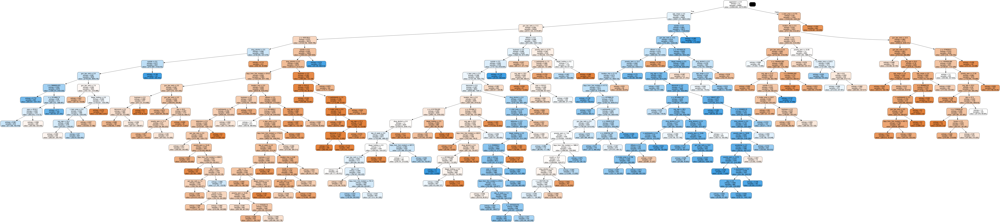

In [17]:
dot_data = export_graphviz(
    best_model[0],
    out_file=None, 
    feature_names=list(indicators_train_df.columns),
    filled=True,
    rounded=True
)
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

Display the second tree:

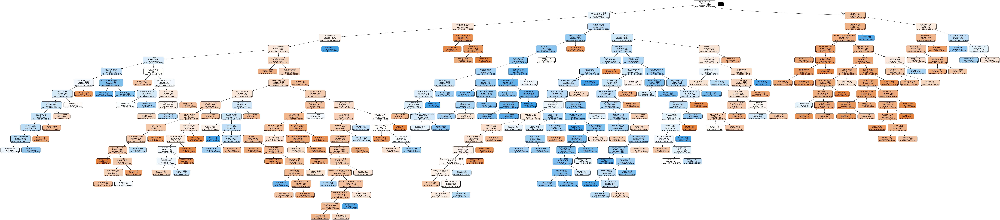

In [18]:
dot_data = export_graphviz(
    best_model[1],
    out_file=None, 
    feature_names=list(indicators_train_df.columns),
    filled=True,
    rounded=True
)
graph = pydotplus.graph_from_dot_data(dot_data)
Image(graph.create_png())

We display the feature importances:

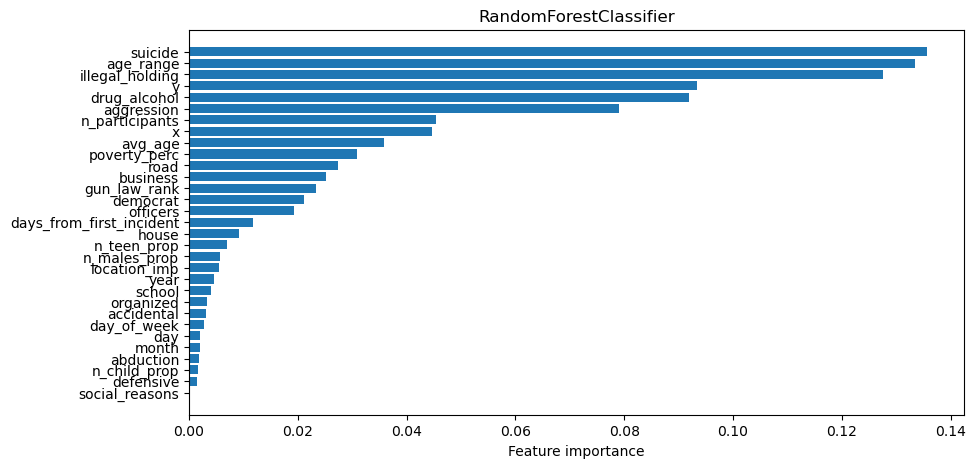

In [19]:
fig, axs = plt.subplots(1, 1, figsize=(10, 5))
display_feature_importances(
    feature_names=best_model.feature_names_in_,
    feature_importances=best_model.feature_importances_,
    axs=axs,
    title=clf_name,
    path=f'{RESULTS_DIR}/{clf_name}_feature_importances.csv'
)

We display confusion matrices:

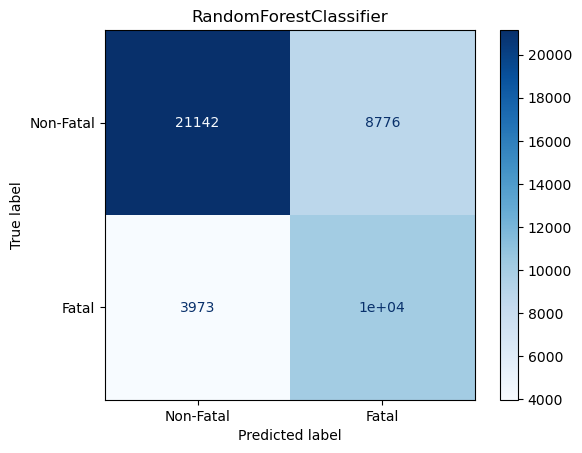

In [20]:
plot_confusion_matrix(
    y_true=true_labels_test,
    y_pred=pred_labels_test,
    title=clf_name
)

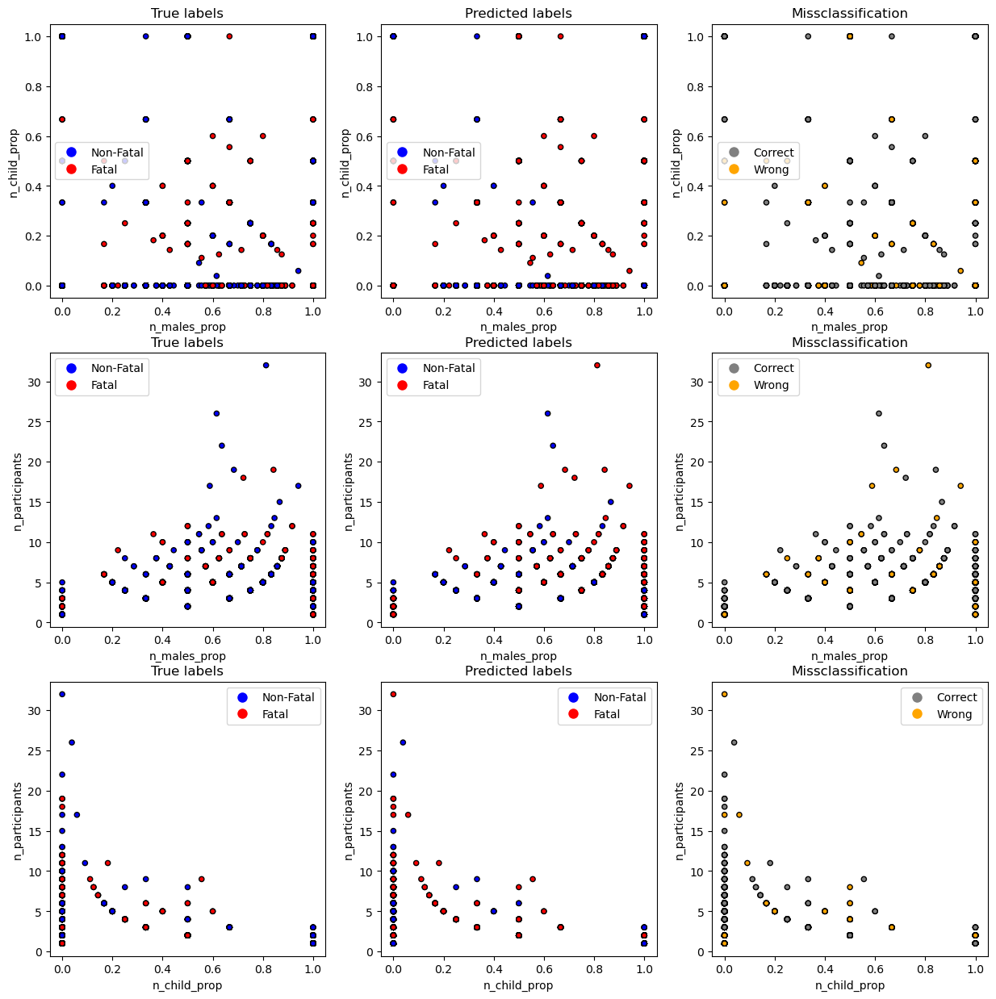

In [21]:
plot_predictions_in_features_space(
    df=incidents_test_df,
    features=['n_males_prop', 'n_child_prop', 'n_participants'], # TODO: farlo con features significativve
    true_labels=true_labels_test,
    pred_labels=pred_labels_test,
    figsize=(15, 15)
)

We plot the ROC curve:

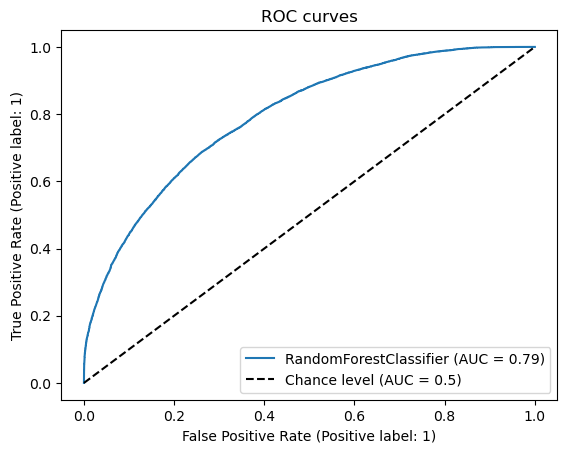

In [22]:
plot_roc(y_true=true_labels_test, y_probs=[pred_probas_test[:,1]], names=[clf_name])

We plot the decision boundaries:

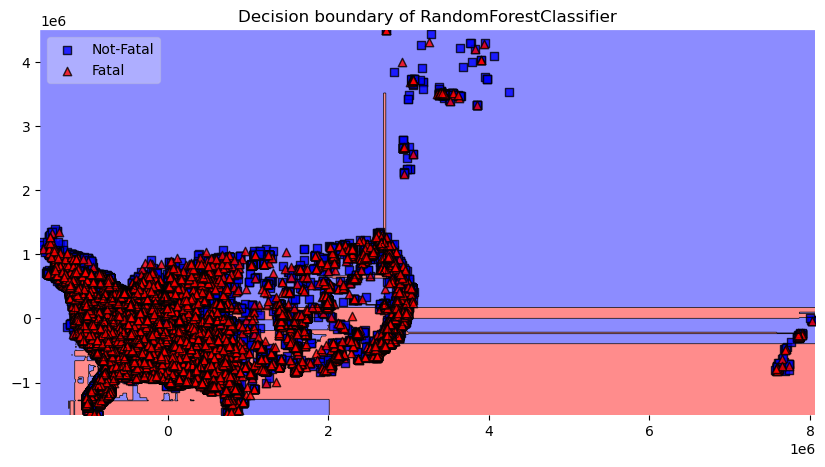

In [23]:
fig, axs = plt.subplots(1, 1, figsize=(10, 5))
plot_PCA_decision_boundary(
  train_set=indicators_train_df,
  features=indicators_train_df.columns, # TODO: eventualmente usare solo le numeriche
  train_label=true_labels_train,
  classifier=best_model,
  classifier_name=clf_name,
  axs=axs
)

We plot the learning curve:

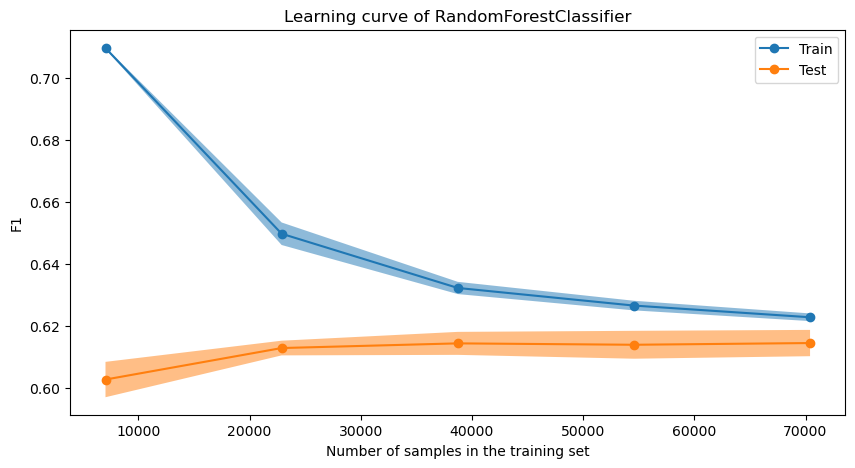

In [24]:
fig, axs = plt.subplots(1, 1, figsize=(10, 5))
plot_learning_curve(
    classifier=best_model,
    classifier_name=clf_name,
    train_set=indicators_train_df,
    labels=true_labels_train,
    ax=axs,
    train_sizes=np.linspace(0.1, 1.0, 5),
    metric='f1'
)

We plot the performance of the best model varying the complexity parameters:

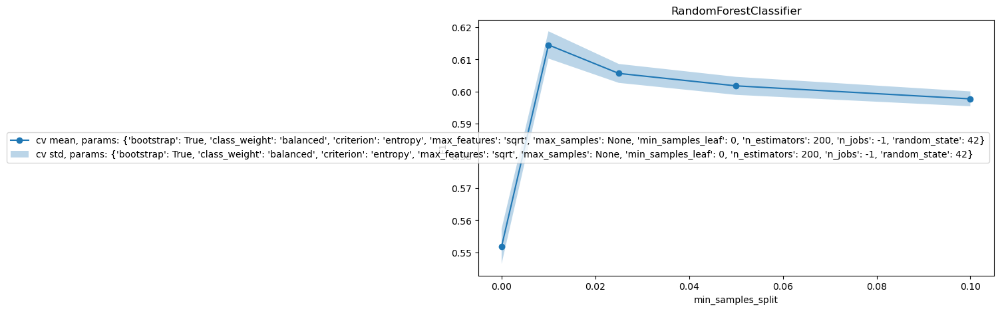

In [25]:
param_of_interest = 'min_samples_split'
fixed_params = best_model_params.copy()
fixed_params.pop(param_of_interest)
if fixed_params['min_samples_leaf']==1:
    fixed_params['min_samples_leaf'] = 0
fig, axs = plt.subplots(1, 1, figsize=(10, 5))
plot_scores_varying_params(
    cv_results_df,
    param_of_interest,
    fixed_params,
    'F1',
    axs,
    title=clf_name
)

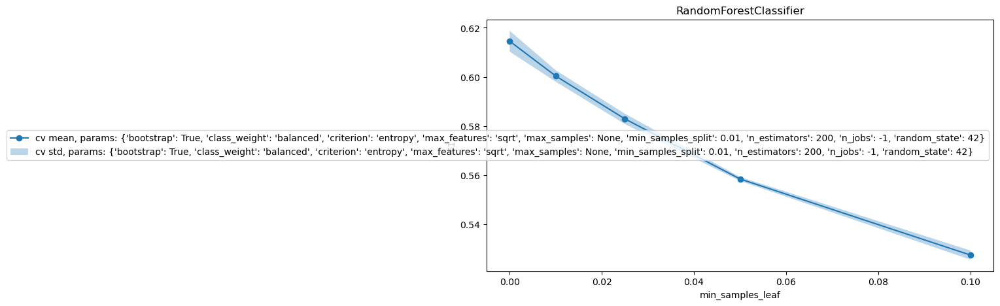

In [26]:
param_of_interest = 'min_samples_leaf'
fixed_params = best_model_params.copy()
fixed_params.pop(param_of_interest)
if fixed_params['min_samples_split']==2:
    fixed_params['min_samples_split'] = 0
fig, axs = plt.subplots(1, 1, figsize=(10, 5))
plot_scores_varying_params(
    cv_results_df,
    param_of_interest,
    fixed_params,
    'F1',
    axs,
    title=clf_name
)

We plot the distribution of the features for misclassified incidents:

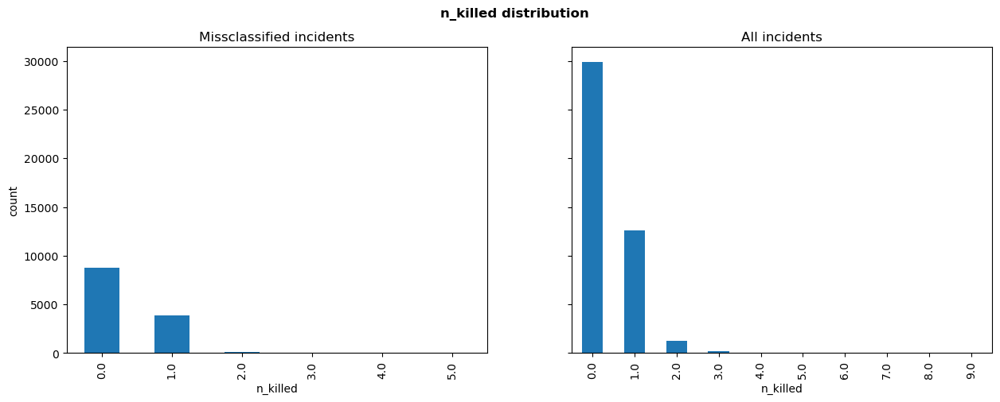

In [27]:
plot_distribution_missclassifications(
    true_labels_test,
    pred_labels_test,
    incidents_test_df,
    'n_killed',
    'bar',
    title='n_killed distribution'
)

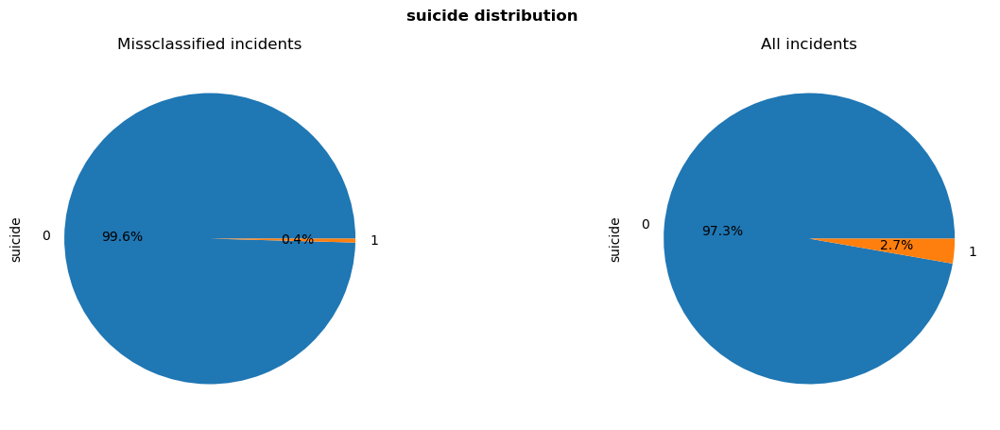

In [28]:
plot_distribution_missclassifications(
    true_labels_test,
    pred_labels_test,
    incidents_test_df,
    'suicide',
    'pie',
    title='suicide distribution'
)

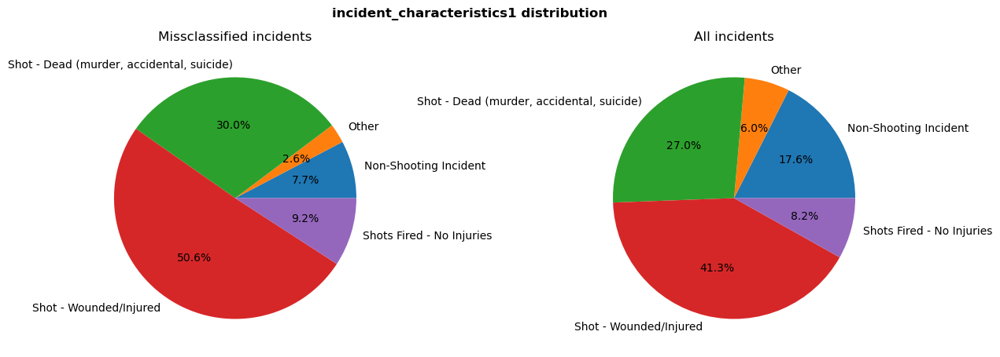

In [29]:
plot_distribution_missclassifications(
    true_labels_test,
    pred_labels_test,
    incidents_test_df,
    'incident_characteristics1',
    'pie',
    title='incident_characteristics1 distribution'
)

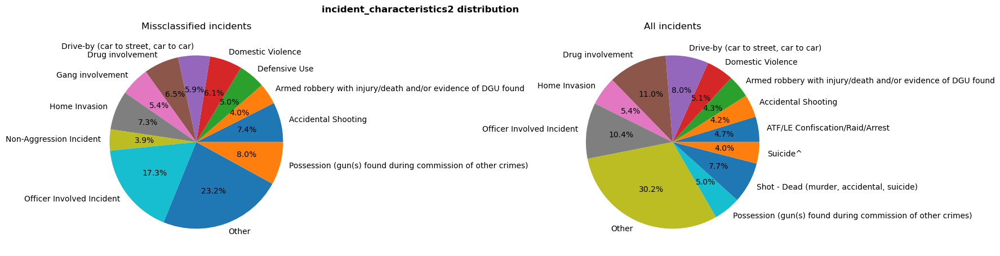

In [30]:
plot_distribution_missclassifications(
    true_labels_test,
    pred_labels_test,
    incidents_test_df,
    'incident_characteristics2',
    'pie',
    pie_perc_threshold=2,
    figsize=(20, 5),
    title='incident_characteristics2 distribution'
)

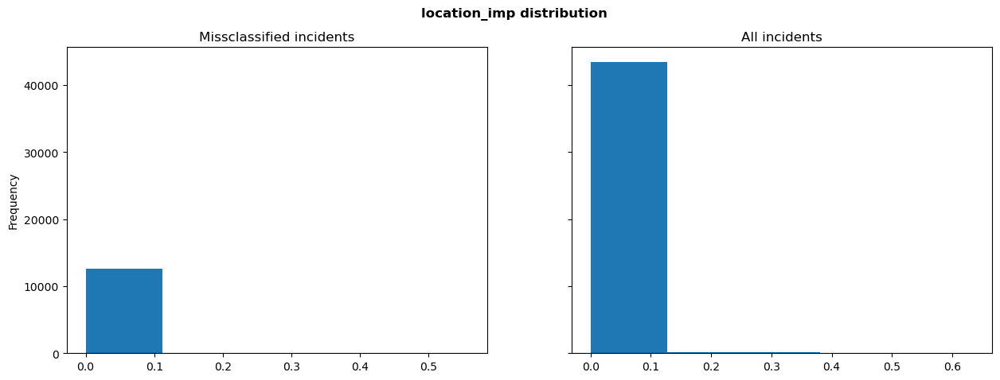

In [31]:
plot_distribution_missclassifications(
    true_labels_test,
    pred_labels_test,
    incidents_test_df,
    'location_imp',
    'hist',
    bins=5,
    title='location_imp distribution'
)